In [2]:
import xarray as xr
import numpy as np
import glob2 as glob
import functions
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy

In [3]:
rpath = '/nird/datapeak/NS9600K/astridbg/arctic-cld-feedbacks/data/'
files = glob.glob(rpath+'*soilmoisture.clm2.concatfiles.nc')

ds_list = {}

# Open pre-industrial dataset
ds_piClim = xr.open_dataset(files[2])
ds_piClim = ds_piClim.isel(time=slice(0,1740))
ds_piClim = functions.fix_clm_time(ds_piClim)

# Open divided 2xCO2 dataset
ds_2xCO2_i = xr.open_dataset(files[1])
ds_2xCO2_ii = xr.open_dataset(files[7])
ds_2xCO2 = xr.merge([ds_2xCO2_i.isel(time=slice(0,480)), ds_2xCO2_ii])
ds_2xCO2 = ds_2xCO2.isel(time=slice(0,1740))
ds_2xCO2 = functions.fix_clm_time(ds_2xCO2)
ds_list['CO2x2'] = ds_2xCO2

for i in [0, 3, 4, 5, 6]:
    casename = files[i].split('/')[-1]
    co2_conc = casename.split('_')[0]
    co2_conc = co2_conc.split('N')[-1]
    ds = xr.open_dataset(files[i])
    ds = ds.isel(time=slice(0,1740))
    ds = functions.fix_clm_time(ds)
    ds_list[co2_conc] = ds

/tmp/ipykernel_3605380/1650821129.py:7: SerializationWarning: Unable to decode time axis into full numpy.datetime64[ns] objects, continuing using cftime.datetime objects instead, reason: dates out of range. To silence this warning use a coarser resolution 'time_unit' or specify 'use_cftime=True'.
  ds_piClim = xr.open_dataset(files[2])
/nird/datapeak/NS9600K/astridbg/arctic-cld-feedbacks/arctic-cloud-feedbacks/functions.py:45: SerializationWarning: Unable to decode time axis into full numpy.datetime64[ns] objects, continuing using cftime.datetime objects instead, reason: dates out of range. To silence this warning use a coarser resolution 'time_unit' or specify 'use_cftime=True'.
  months = ds.time_bounds.isel(hist_interval=0).dt.month.values
/nird/datapeak/NS9600K/astridbg/arctic-cld-feedbacks/arctic-cloud-feedbacks/functions.py:46: SerializationWarning: Unable to decode time axis into full numpy.datetime64[ns] objects, continuing using cftime.datetime objects instead, reason: dates o

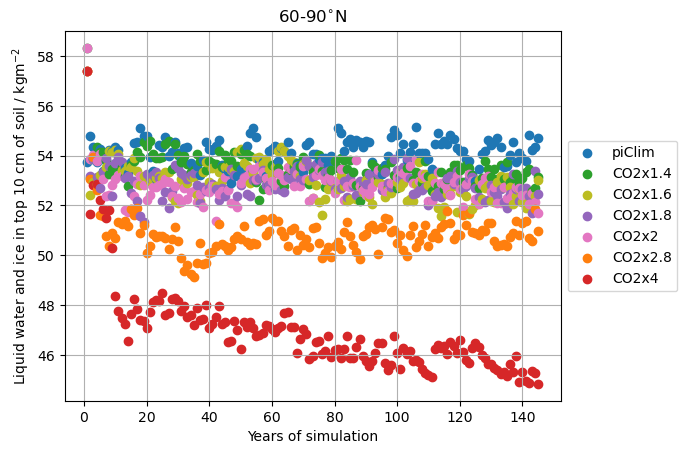

In [90]:
# Make a spatial average
Arctic_lim = 60
var = 'SOILWATER_10CM'
area_weights = ds_piClim['area'].sel(lat=slice(Arctic_lim,90))/ds_piClim['area'].sel(lat=slice(Arctic_lim,90)).sum()
piClim_Arctic = ds_piClim[var].sel(lat=slice(Arctic_lim,90))
annual_piClim = piClim_Arctic.groupby(piClim_Arctic.time.dt.year).mean('time')

ds_Arctic_list = {}
for k in ['CO2x1.4', 'CO2x1.6', 'CO2x1.8', 'CO2x2', 'CO2x2.8', 'CO2x4']:
    ds = ds_list[k]
    ds_Arctic = ds[var].sel(lat=slice(Arctic_lim,90))
    annual = ds_Arctic.groupby(ds_Arctic.time.dt.year).mean('time')
    ds_Arctic_list[k] = annual

color_list = ['tab:green', 'tab:olive', 'tab:purple', 'tab:pink', 'tab:orange', 'tab:red']
colors = {}
for i, k in enumerate(['CO2x1.4', 'CO2x1.6', 'CO2x1.8', 'CO2x2', 'CO2x2.8', 'CO2x4']):
    colors[k] = color_list[i]

plt.scatter(1, (annual_piClim.isel(year=0)*area_weights).sum(), color='tab:blue', label='piClim')
for k in ['CO2x1.4', 'CO2x1.6', 'CO2x1.8', 'CO2x2', 'CO2x2.8', 'CO2x4']:
    plt.scatter(1, (ds_Arctic_list[k].isel(year=0)*area_weights).sum(), color=colors[k], label=k)

for i in range(1, len(annual_piClim.year)):
    plt.scatter(1+i, (annual_piClim.isel(year=i)*area_weights).sum(), color='tab:blue')
    for k in ['CO2x1.4', 'CO2x1.6', 'CO2x1.8', 'CO2x2', 'CO2x2.8', 'CO2x4']:
        plt.scatter(1+i, (ds_Arctic_list[k].isel(year=i)*area_weights).sum(), color=colors[k])
plt.grid()
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
plt.xlabel('Years of simulation')
plt.ylabel('Liquid water and ice in top 10 cm of soil / kgm$^{-2}$')
plt.title(str(Arctic_lim)+'-90$^{\circ}$N')
plt.show()

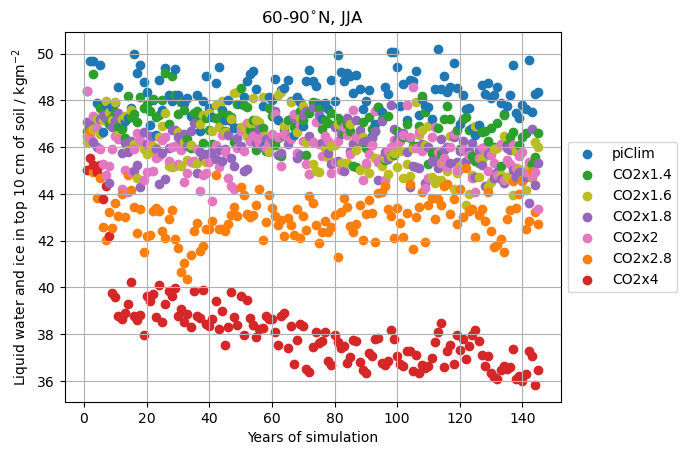

In [92]:
# Make a spatial average
Arctic_lim = 60
var = 'SOILWATER_10CM'
season = 'JJA'

area_weights = ds_piClim['area'].sel(lat=slice(Arctic_lim,90))/ds_piClim['area'].sel(lat=slice(Arctic_lim,90)).sum()
piClim_Arctic = ds_piClim[var].sel(lat=slice(Arctic_lim,90))
piClim_season = piClim_Arctic.sel(time=piClim_Arctic.time.dt.season==season)
annual_piClim = piClim_season.groupby(piClim_season.time.dt.year).mean('time')

ds_Arctic_list = {}
for k in ['CO2x1.4', 'CO2x1.6', 'CO2x1.8', 'CO2x2', 'CO2x2.8', 'CO2x4']:
    ds = ds_list[k]
    ds_Arctic = ds[var].sel(lat=slice(Arctic_lim,90))
    ds_season = ds_Arctic.sel(time=ds_Arctic.time.dt.season==season)
    annual = ds_season.groupby(ds_season.time.dt.year).mean('time')
    ds_Arctic_list[k] = annual

color_list = ['tab:green', 'tab:olive', 'tab:purple', 'tab:pink', 'tab:orange', 'tab:red']
colors = {}
for i, k in enumerate(['CO2x1.4', 'CO2x1.6', 'CO2x1.8', 'CO2x2', 'CO2x2.8', 'CO2x4']):
    colors[k] = color_list[i]

plt.scatter(1, (annual_piClim.isel(year=0)*area_weights).sum(), color='tab:blue', label='piClim')
for k in ['CO2x1.4', 'CO2x1.6', 'CO2x1.8', 'CO2x2', 'CO2x2.8', 'CO2x4']:
    plt.scatter(1, (ds_Arctic_list[k].isel(year=0)*area_weights).sum(), color=colors[k], label=k)

for i in range(1, len(annual_piClim.year)):
    plt.scatter(1+i, (annual_piClim.isel(year=i)*area_weights).sum(), color='tab:blue')
    for k in ['CO2x1.4', 'CO2x1.6', 'CO2x1.8', 'CO2x2', 'CO2x2.8', 'CO2x4']:
        plt.scatter(1+i, (ds_Arctic_list[k].isel(year=i)*area_weights).sum(), color=colors[k])
plt.grid()
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
plt.xlabel('Years of simulation')
plt.ylabel('Liquid water and ice in top 10 cm of soil / kgm$^{-2}$')
plt.title(str(Arctic_lim)+'-90$^{\circ}$N, '+season)
plt.show()

In [3]:
rpath = '/nird/datapeak/NS9600K/astridbg/arctic-cld-feedbacks/data/'
SM_ERA5 = xr.open_dataset(rpath+'soil_moisture_ERA5/data_stream-moda.nc')
SM_ERA5['swvl1']

<xarray.DataArray 'swvl1' (valid_time: 909, latitude: 301, longitude: 3600)> Size: 4GB
[984992400 values with dtype=float32]
Coordinates:
    number      int64 8B ...
  * valid_time  (valid_time) datetime64[ns] 7kB 1950-01-01 ... 2025-09-01
  * latitude    (latitude) float64 2kB 90.0 89.9 89.8 89.7 ... 60.2 60.1 60.0
  * longitude   (longitude) float64 29kB -180.0 -179.9 -179.8 ... 179.8 179.9
    expver      (valid_time) <U4 15kB ...
Attributes: (12/31)
    GRIB_paramId:                             39
    GRIB_dataType:                            an
    GRIB_numberOfPoints:                      1083600
    GRIB_typeOfLevel:                         depthBelowLandLayer
    GRIB_stepUnits:                           1
    GRIB_gridType:                            regular_ll
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_units:                               m**3 m**-3
    long_name:                                Volumetric soil water layer 1
    units:                                    m**3 m**-3
    standard_name:                            unknown
    GRIB_depthBelowLandLayer:                 0.0

In [4]:
# Make a spatial average
Arctic_lim = 60
var = 'swvl1'
season = 'JJA'

# Choose area

SM_Arctic = functions.computeWeightedMean_ERA5_Land(SM_ERA5)

KeyboardInterrupt: 

<xarray.Dataset> Size: 376B
Dimensions:  (year: 23)
Coordinates:
    number   int64 8B 0
  * year     (year) int64 184B 2002 2003 2004 2005 2006 ... 2021 2022 2023 2024
Data variables:
    swvl1    (year) float64 184B 0.3234 0.3186 0.322 ... 0.3091 0.309 0.3085
-0.03567700893631423
0.010420364131261574


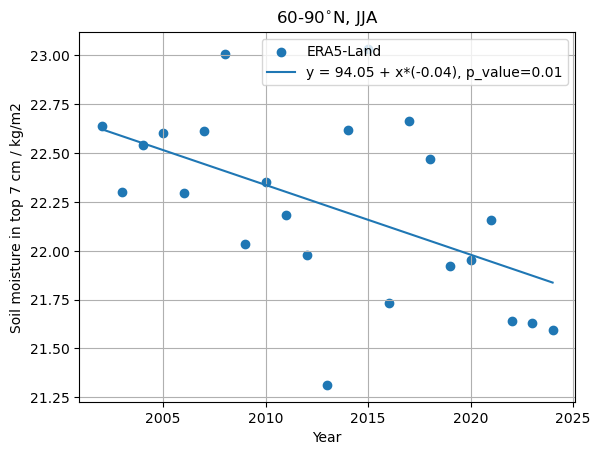

In [108]:
season = 'JJA'
var = 'swvl1'

# Seasonal averages
ds_season = SM_Arctic.sel(valid_time=SM_Arctic .valid_time.dt.season==season)
ds_annual = ds_season.groupby(ds_season.valid_time.dt.year).mean('valid_time')
ds_annual = ds_annual.sel(year=slice(2002,2024))
print(ds_annual)

plt.scatter(ds_annual.year[0], ds_annual[var].isel(year=0)*70, color='tab:blue', label='ERA5-Land')

for i in range(1, len(ds_annual.year)):
    plt.scatter(ds_annual.year[i], ds_annual[var].isel(year=i)*70, color='tab:blue')

from scipy import stats

slope, intercept, r_value, p_value, std_err = stats.linregress(ds_annual.year, ds_annual[var].values*70)
plt.plot(ds_annual.year, intercept+slope*ds_annual.year, 
         label='y = '+str(np.round(intercept,2))+' + x*('+str(np.round(slope,2))+'), p_value='+str(np.round(p_value,2)))
print(slope)
print(p_value)
plt.grid()
plt.legend()
plt.xlabel('Year')
plt.ylabel('Soil moisture in top 7 cm / kg/m2')
plt.title(str(Arctic_lim)+'-90$^{\circ}$N, '+season)
plt.show()

In [70]:
var = 'swvl1'
ds_season = SM_ERA5.sel(valid_time=SM_ERA5.valid_time.dt.season==season)
ds_annual = ds_season.groupby(ds_season.valid_time.dt.year).mean('valid_time')
converted_ds_annual = ds_annual[var]*70 # from m3/m3 to kg/m2

In [ ]:
from scipy import stats
savedir="/nird/datapeak/NS9600K/astridbg/arctic-cld-feedbacks/data/soil_moisture_ERA5/"

#for season in ["DJF", "MAM","JJA","SON"]:
for season in ["JJA"]:
    ds_season = SM_ERA5.sel(valid_time=SM_ERA5.valid_time.dt.season==season)
    ds_annual = ds_season.groupby(ds_season.valid_time.dt.year).mean('valid_time')
    converted_ds_annual = ds_annual[var]*70 # from m3/m3 to kg/m2

    trends = np.ones((len(SM_ERA5.longitude),len(SM_ERA5.latitude)))*np.nan
    p_values = np.ones((len(SM_ERA5.longitude),len(SM_ERA5.latitude)))*np.nan
    for ilon in range(len(SM_ERA5.longitude)):
        for ilat in range(len(SM_ERA5.latitude)):
            slope, intercept, r_value, p_value, std_err = stats.linregress(converted_ds_annual.year, converted_ds_annual.isel(longitude=ilon, latitude=ilat))
            trends[ilon, ilat] = slope
            p_values[ilon, ilat] = p_value
    
    ds_annual['trend'] = ({'longitude':SM_ERA5.longitude, 'latitude':SM_ERA5.latitude}, trends)
    ds_annual['p_value'] = ({'longitude':SM_ERA5.longitude, 'latitude':SM_ERA5.latitude}, p_values)

    ds_annual.to_netcdf(savedir+"SM_ERA5_trends_"+season+".nc")


In [75]:
from scipy import stats
savedir="/nird/datapeak/NS9600K/astridbg/arctic-cld-feedbacks/data/soil_moisture_ERA5/"

#for season in ["DJF", "MAM","JJA","SON"]:
for season in ["JJA"]:
    ds_season = SM_ERA5.sel(valid_time=SM_ERA5.valid_time.dt.season==season)
    ds_annual = ds_season.groupby(ds_season.valid_time.dt.year).mean('valid_time')
    converted_ds_annual = ds_annual[var]*70 # from m3/m3 to kg/m2

    trends = np.ones((len(SM_ERA5.longitude),len(SM_ERA5.latitude)))*np.nan
    p_values = np.ones((len(SM_ERA5.longitude),len(SM_ERA5.latitude)))*np.nan
    for ilon in range(len(SM_ERA5.longitude)):
        for ilat in range(len(SM_ERA5.latitude)):
            slope, intercept, r_value, p_value, std_err = stats.linregress(converted_ds_annual.year.sel(year=slice(2002,2024)), converted_ds_annual.isel(longitude=ilon, latitude=ilat).sel(year=slice(2002,2024)))
            trends[ilon, ilat] = slope
            p_values[ilon, ilat] = p_value
    
    ds_annual['trend'] = ({'longitude':SM_ERA5.longitude, 'latitude':SM_ERA5.latitude}, trends)
    ds_annual['p_value'] = ({'longitude':SM_ERA5.longitude, 'latitude':SM_ERA5.latitude}, p_values)

    ds_annual.to_netcdf(savedir+"SM_ERA5_trends_"+season+"_2002_2024.nc")


In [25]:
from scipy import stats
savedir="/nird/datapeak/NS9600K/astridbg/arctic-cld-feedbacks/data/soil_moisture_ERA5/"
var='swvl1'

#for season in ["DJF", "MAM","JJA","SON"]:
for season in ["JJA"]:
    ds_season = SM_ERA5.sel(valid_time=SM_ERA5.valid_time.dt.season==season)
    ds_annual = ds_season.groupby(ds_season.valid_time.dt.year).mean('valid_time')
    converted_ds_annual = ds_annual[var]*70 # from m3/m3 to kg/m2

    trends = np.ones((len(SM_ERA5.longitude),len(SM_ERA5.latitude)))*np.nan
    p_values = np.ones((len(SM_ERA5.longitude),len(SM_ERA5.latitude)))*np.nan
    for ilon in range(len(SM_ERA5.longitude)):
        for ilat in range(len(SM_ERA5.latitude)):
            slope, intercept, r_value, p_value, std_err = stats.linregress(converted_ds_annual.year.sel(year=slice(1970,2016)), converted_ds_annual.isel(longitude=ilon, latitude=ilat).sel(year=slice(1970,2016)))
            trends[ilon, ilat] = slope
            p_values[ilon, ilat] = p_value
    
    ds_annual['trend'] = ({'longitude':SM_ERA5.longitude, 'latitude':SM_ERA5.latitude}, trends)
    ds_annual['p_value'] = ({'longitude':SM_ERA5.longitude, 'latitude':SM_ERA5.latitude}, p_values)

    ds_annual.to_netcdf(savedir+"SM_ERA5_trends_"+season+"_1970_2016.nc")


In [53]:
season="JJA"
rpath = "/nird/datapeak/NS9600K/astridbg/arctic-cld-feedbacks/data/soil_moisture_ERA5/"
ds_annual = xr.open_dataset(rpath+"SM_ERA5_trends_"+season+".nc")
ds_annual = ds_annual.reindex(latitude=list(reversed(ds_annual.latitude)))

Text(0.5, 0, 'kg m$^{-2}$ year$^{-1}$')

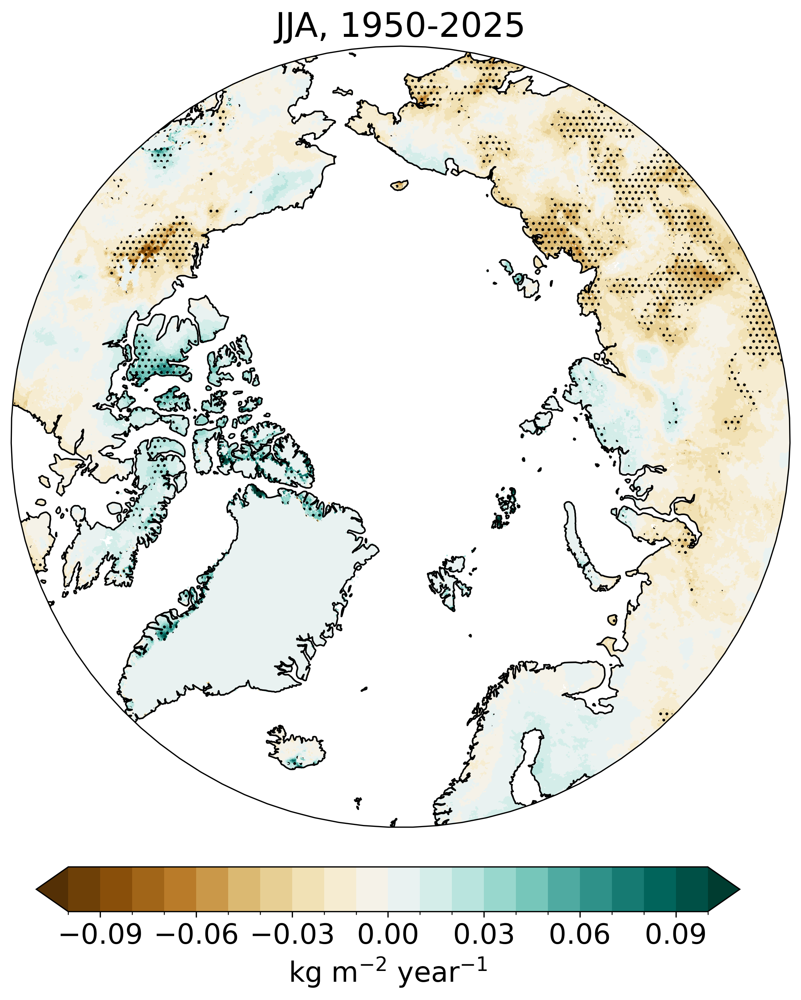

In [7]:
rpath = "/nird/datapeak/NS9600K/astridbg/arctic-cld-feedbacks/data/soil_moisture_ERA5/"


lim = 0.1
levels = np.linspace(-lim, lim, 21)
significance_level=0.05
density = 3

import cartopy.crs as ccrs
fig = plt.figure(1, figsize=[9,10],dpi=300)

# Set the projection to use for plotting
ax1 = plt.subplot(1, 1, 1, projection=ccrs.Orthographic(0, 90))
#ax1 = plt.subplot(2, 2, 1, projection=ccrs.Orthographic(0, 90))
#ax2 = plt.subplot(2, 2, 2, projection=ccrs.Orthographic(0, 90))
#ax3 = plt.subplot(2, 2, 3, projection=ccrs.Orthographic(0, 90))
#ax4 = plt.subplot(2, 2, 4, projection=ccrs.Orthographic(0, 90))

#for ax,season,label in zip([ax1, ax2, ax3, ax4], ["DJF", "MAM","JJA","SON"], ["(a)", "(b)", "(c)", "(d)"]):
for ax,season in zip([ax1], ["JJA"]):

    functions.polarCentral_set_latlim([60,90], ax)
    ds = xr.open_dataset(rpath+"SM_ERA5_trends_"+season+".nc")
    ds = ds.reindex(latitude=list(reversed(ds.latitude)))
    data = ds['trend'].T
    map = data.plot.pcolormesh(ax=ax, transform=ccrs.PlateCarree(), 
                                        cmap='BrBG', levels=levels,
                                        add_colorbar=False)
    hatch = ax.contourf(ds.longitude, ds.latitude, ds['p_value'].T < significance_level, transform=ccrs.PlateCarree(), colors='none', levels=[.5,1.5], hatches=[density*'.', density*'.'])
    #hatch.set_edgecolor('white')
    #hatch._hatch_color = (1, 1, 1, 1.0)
    ax.set_title(season+", 1950-2025", fontsize=22)
    ax.coastlines()


cb_ax = fig.add_axes([0.15, 0.07, 0.7, 0.04])

cbar = plt.colorbar(map, cax=cb_ax, spacing = 'uniform', extend='both', orientation='horizontal', fraction=0.046, pad=0.06)
cbar.ax.tick_params(labelsize=18)
cbar.ax.set_xlabel('kg m$^{-2}$ year$^{-1}$', fontsize=18)

Text(0.5, 0, 'kg m$^{-2}$ year$^{-1}$')

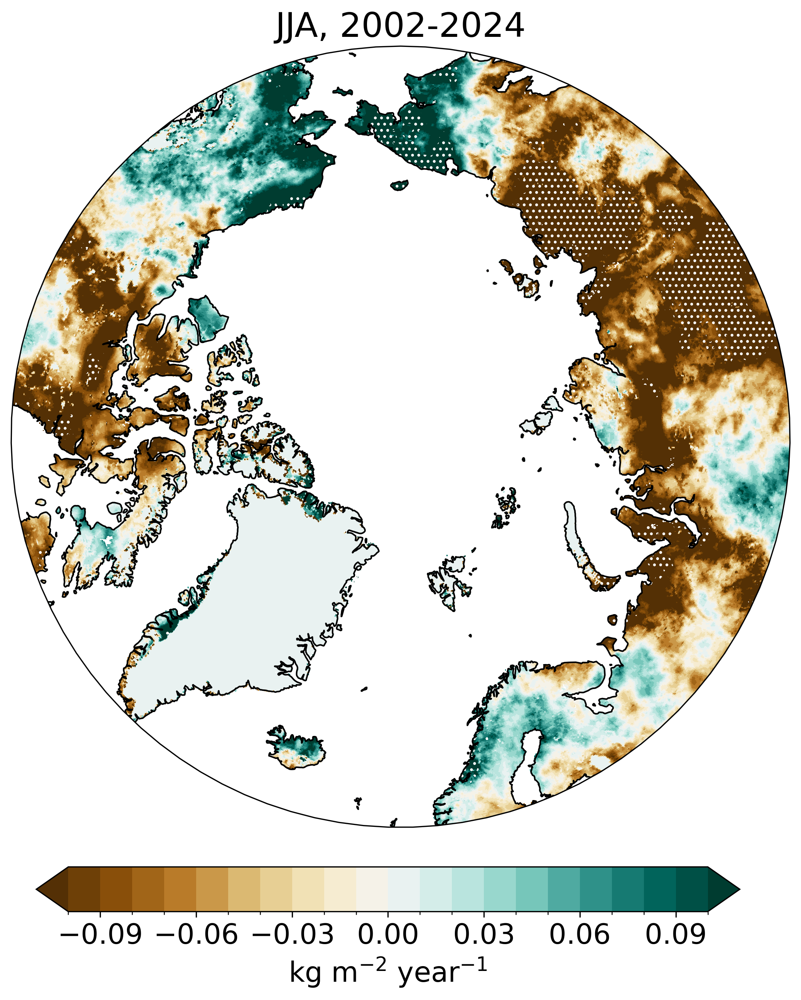

In [140]:
lim = 0.1
levels = np.linspace(-lim, lim, 21)
significance_level=0.05
density = 3

import cartopy.crs as ccrs
fig = plt.figure(1, figsize=[9,10],dpi=300)

# Set the projection to use for plotting
ax1 = plt.subplot(1, 1, 1, projection=ccrs.Orthographic(0, 90))
#ax1 = plt.subplot(2, 2, 1, projection=ccrs.Orthographic(0, 90))
#ax2 = plt.subplot(2, 2, 2, projection=ccrs.Orthographic(0, 90))
#ax3 = plt.subplot(2, 2, 3, projection=ccrs.Orthographic(0, 90))
#ax4 = plt.subplot(2, 2, 4, projection=ccrs.Orthographic(0, 90))

#for ax,season,label in zip([ax1, ax2, ax3, ax4], ["DJF", "MAM","JJA","SON"], ["(a)", "(b)", "(c)", "(d)"]):
for ax,season in zip([ax1], ["JJA"]):

    functions.polarCentral_set_latlim([60,90], ax)
    ds = xr.open_dataset(rpath+"SM_ERA5_trends_"+season+"_2002_2024.nc")
    ds = ds.reindex(latitude=list(reversed(ds.latitude)))
    data = ds['trend'].T
    map = data.plot.pcolormesh(ax=ax, transform=ccrs.PlateCarree(), 
                                        cmap='BrBG', levels=levels,
                                        add_colorbar=False)
    hatch = ax.contourf(ds.longitude, ds.latitude, ds['p_value'].T < significance_level, transform=ccrs.PlateCarree(), colors='none', levels=[.5,1.5], hatches=[density*'.',density*'.'])
    #hatch.set_edgecolor('white')
    hatch._hatch_color = (1, 1, 1, 1.0)
    ax.set_title(season+", 2002-2024", fontsize=22)
    ax.coastlines()


cb_ax = fig.add_axes([0.15, 0.07, 0.7, 0.04])

cbar = plt.colorbar(map, cax=cb_ax, spacing = 'uniform', extend='both', orientation='horizontal', fraction=0.046, pad=0.06)
cbar.ax.tick_params(labelsize=18)
cbar.ax.set_xlabel('kg m$^{-2}$ year$^{-1}$', fontsize=18)

Text(0.5, 0, 'kg m$^{-2}$ year$^{-1}$')

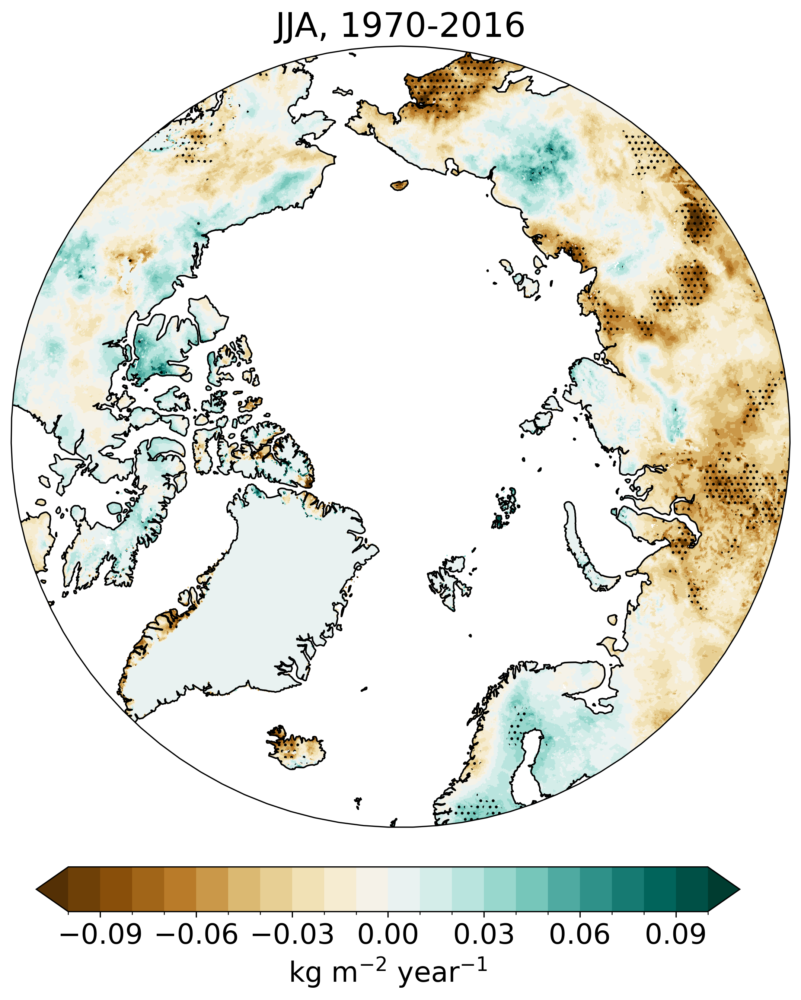

In [29]:
lim = 0.1
levels = np.linspace(-lim, lim, 21)
significance_level=0.05
density = 3
season="JJA"
rpath="/nird/datapeak/NS9600K/astridbg/arctic-cld-feedbacks/data/soil_moisture_ERA5/"

import cartopy.crs as ccrs
fig = plt.figure(1, figsize=[9,10],dpi=300)

# Set the projection to use for plotting
ax1 = plt.subplot(1, 1, 1, projection=ccrs.Orthographic(0, 90))
#ax1 = plt.subplot(2, 2, 1, projection=ccrs.Orthographic(0, 90))
#ax2 = plt.subplot(2, 2, 2, projection=ccrs.Orthographic(0, 90))
#ax3 = plt.subplot(2, 2, 3, projection=ccrs.Orthographic(0, 90))
#ax4 = plt.subplot(2, 2, 4, projection=ccrs.Orthographic(0, 90))

#for ax,season,label in zip([ax1, ax2, ax3, ax4], ["DJF", "MAM","JJA","SON"], ["(a)", "(b)", "(c)", "(d)"]):
for ax,season in zip([ax1], ["JJA"]):

    functions.polarCentral_set_latlim([60,90], ax)
    ds = xr.open_dataset(rpath+"SM_ERA5_trends_"+season+"_1970_2016.nc")
    ds = ds.reindex(latitude=list(reversed(ds.latitude)))
    data = ds['trend'].T
    map = data.plot.pcolormesh(ax=ax, transform=ccrs.PlateCarree(), 
                                        cmap='BrBG', levels=levels,
                                        add_colorbar=False)
    hatch = ax.contourf(ds.longitude, ds.latitude, ds['p_value'].T < significance_level, transform=ccrs.PlateCarree(), colors='none', levels=[.5,1.5], hatches=[density*'.',density*'.'])
    #hatch.set_edgecolor('white')
    #hatch._hatch_color = (1, 1, 1, 1.0)
    ax.set_title(season+", 1970-2016", fontsize=22)
    ax.coastlines()


cb_ax = fig.add_axes([0.15, 0.07, 0.7, 0.04])

cbar = plt.colorbar(map, cax=cb_ax, spacing = 'uniform', extend='both', orientation='horizontal', fraction=0.046, pad=0.06)
cbar.ax.tick_params(labelsize=18)
cbar.ax.set_xlabel('kg m$^{-2}$ year$^{-1}$', fontsize=18)

In [8]:
filepath='/nird/datalake/NS9560K/diagnostics/ILAMB-Data/DATA/mrsos/WangMao/mrsos_olc.nc'
ds_SM_WM = xr.open_dataset(filepath)

In [145]:
ds_SM_WM['mrsos']

<xarray.DataArray 'mrsos' (time: 564, lat: 360, lon: 720)> Size: 1GB
[146188800 values with dtype=float64]
Coordinates:
  * time     (time) object 5kB 1970-01-16 12:00:00 ... 2016-12-16 12:00:00
  * lat      (lat) float64 3kB -89.75 -89.25 -88.75 -88.25 ... 88.75 89.25 89.75
  * lon      (lon) float64 6kB -179.8 -179.2 -178.8 -178.2 ... 178.8 179.2 179.8
Attributes:
    units:         kg m-2
    actual_range:  [ 1.58672596 84.13264909]

In [11]:
from scipy import stats
savedir="/nird/datapeak/NS9600K/astridbg/arctic-cld-feedbacks/data/soil_moisture_ERA5/"

#for season in ["DJF", "MAM","JJA","SON"]:
for season in ["JJA"]:
    ds_season = ds_SM_WM.sel(time=ds_SM_WM.time.dt.season==season)
    ds_annual = ds_season.groupby(ds_season.time.dt.year).mean('time')

    trends = np.ones((len(ds_SM_WM.lat),len(ds_SM_WM.lon)))*np.nan
    p_values = np.ones((len(ds_SM_WM.lat),len(ds_SM_WM.lon)))*np.nan
    for ilat in range(len(ds_SM_WM.lat)):
        for ilon in range(len(ds_SM_WM.lon)):
            slope, intercept, r_value, p_value, std_err = stats.linregress(ds_annual.year, ds_annual['mrsos'].isel(lat=ilat, lon=ilon))
            trends[ilat, ilon] = slope
            p_values[ilat, ilon] = p_value
    
    ds_annual['trend'] = ({'lat':ds_SM_WM.lat, 'lon':ds_SM_WM.lon}, trends)
    ds_annual['p_value'] = ({'lat':ds_SM_WM.lat, 'lon':ds_SM_WM.lon}, p_values)

    ds_annual.to_netcdf(savedir+"SM_WM_trends_"+season+".nc")

In [19]:
from scipy import stats
savedir="/nird/datapeak/NS9600K/astridbg/arctic-cld-feedbacks/data/soil_moisture_ERA5/"

#for season in ["DJF", "MAM","JJA","SON"]:
for season in ["JJA"]:
    ds_season = ds_SM_WM.sel(time=ds_SM_WM.time.dt.season==season)
    ds_annual = ds_season.groupby(ds_season.time.dt.year).mean('time')

    trends = np.ones((len(ds_SM_WM.lat),len(ds_SM_WM.lon)))*np.nan
    p_values = np.ones((len(ds_SM_WM.lat),len(ds_SM_WM.lon)))*np.nan
    for ilat in range(len(ds_SM_WM.lat)):
        for ilon in range(len(ds_SM_WM.lon)):
            slope, intercept, r_value, p_value, std_err = stats.linregress(ds_annual.year.sel(year=slice(1994,2016)), ds_annual['mrsos'].isel(lat=ilat, lon=ilon).sel(year=slice(1994,2016)))
            trends[ilat, ilon] = slope
            p_values[ilat, ilon] = p_value
    
    ds_annual['trend'] = ({'lat':ds_SM_WM.lat, 'lon':ds_SM_WM.lon}, trends)
    ds_annual['p_value'] = ({'lat':ds_SM_WM.lat, 'lon':ds_SM_WM.lon}, p_values)

    ds_annual.to_netcdf(savedir+"SM_WM_trends_"+season+"_1994_2016.nc")

Text(0.5, 0, 'kg m$^{-2}$ year$^{-1}$')

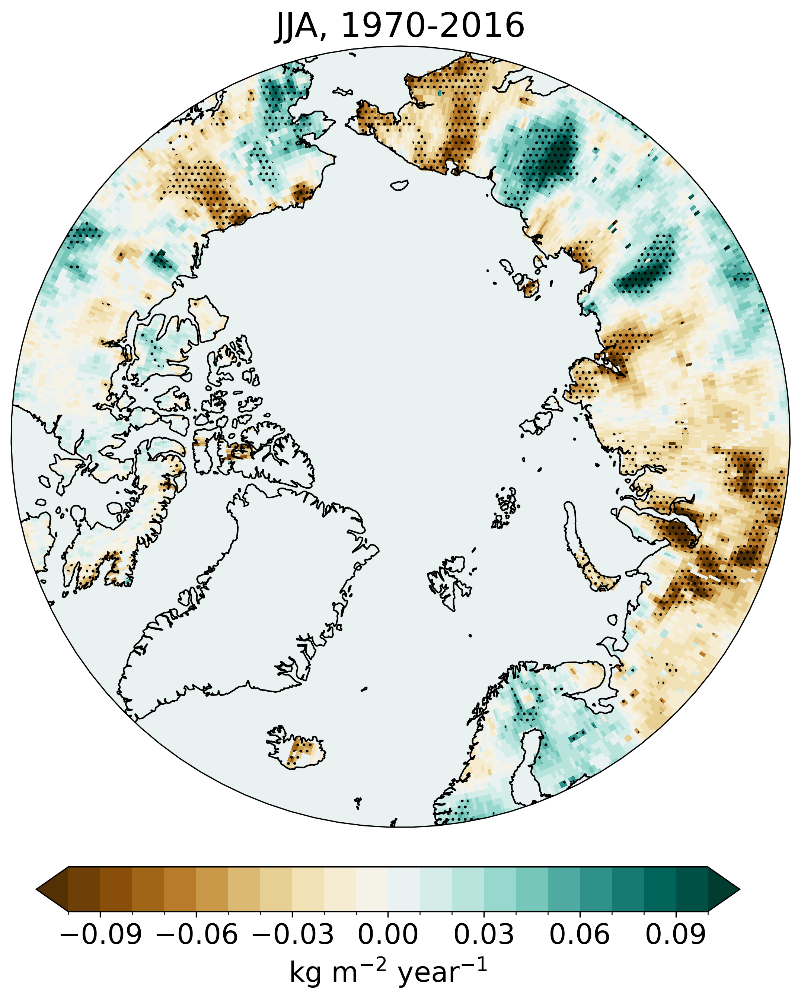

In [18]:
rpath = "/nird/datapeak/NS9600K/astridbg/arctic-cld-feedbacks/data/soil_moisture_ERA5/"


lim = 0.1
levels = np.linspace(-lim, lim, 21)
significance_level=0.05
density = 3

import cartopy.crs as ccrs
fig = plt.figure(1, figsize=[9,10],dpi=300)

# Set the projection to use for plotting
ax1 = plt.subplot(1, 1, 1, projection=ccrs.Orthographic(0, 90))
#ax1 = plt.subplot(2, 2, 1, projection=ccrs.Orthographic(0, 90))
#ax2 = plt.subplot(2, 2, 2, projection=ccrs.Orthographic(0, 90))
#ax3 = plt.subplot(2, 2, 3, projection=ccrs.Orthographic(0, 90))
#ax4 = plt.subplot(2, 2, 4, projection=ccrs.Orthographic(0, 90))

#for ax,season,label in zip([ax1, ax2, ax3, ax4], ["DJF", "MAM","JJA","SON"], ["(a)", "(b)", "(c)", "(d)"]):
for ax,season in zip([ax1], ["JJA"]):

    functions.polarCentral_set_latlim([60,90], ax)
    ds = xr.open_dataset(rpath+"SM_WM_trends_"+season+".nc")
    data = ds['trend']
    map = data.plot.pcolormesh(ax=ax, transform=ccrs.PlateCarree(), 
                                        cmap='BrBG', levels=levels,
                                        add_colorbar=False)
    hatch = ax.contourf(ds.lon, ds.lat, ds['p_value'] < significance_level, transform=ccrs.PlateCarree(), colors='none', levels=[.5,1.5], hatches=[density*'.', density*'.'])
    #hatch.set_edgecolor('white')
    #hatch._hatch_color = (1, 1, 1, 1.0)
    ax.set_title(season+", 1970-2016", fontsize=22)
    ax.coastlines()


cb_ax = fig.add_axes([0.15, 0.07, 0.7, 0.04])

cbar = plt.colorbar(map, cax=cb_ax, spacing = 'uniform', extend='both', orientation='horizontal', fraction=0.046, pad=0.06)
cbar.ax.tick_params(labelsize=18)
cbar.ax.set_xlabel('kg m$^{-2}$ year$^{-1}$', fontsize=18)

Text(0.5, 0, 'kg m$^{-2}$ year$^{-1}$')

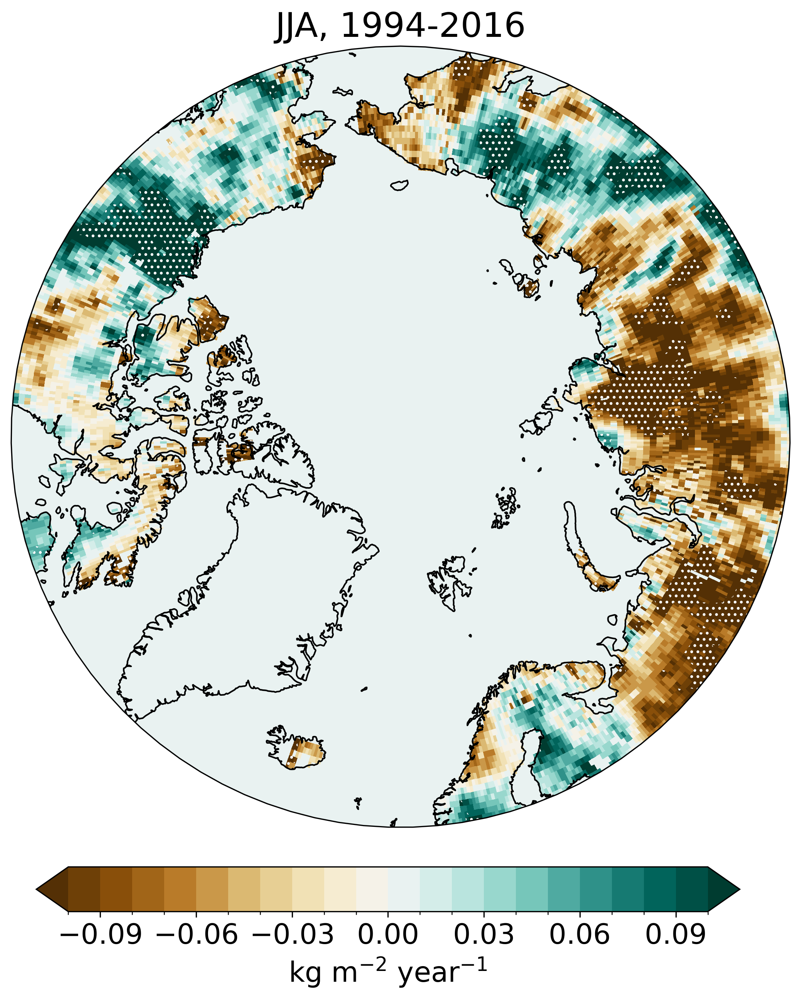

In [21]:
rpath = "/nird/datapeak/NS9600K/astridbg/arctic-cld-feedbacks/data/soil_moisture_ERA5/"


lim = 0.1
levels = np.linspace(-lim, lim, 21)
significance_level=0.05
density = 3

import cartopy.crs as ccrs
fig = plt.figure(1, figsize=[9,10],dpi=300)

# Set the projection to use for plotting
ax1 = plt.subplot(1, 1, 1, projection=ccrs.Orthographic(0, 90))
#ax1 = plt.subplot(2, 2, 1, projection=ccrs.Orthographic(0, 90))
#ax2 = plt.subplot(2, 2, 2, projection=ccrs.Orthographic(0, 90))
#ax3 = plt.subplot(2, 2, 3, projection=ccrs.Orthographic(0, 90))
#ax4 = plt.subplot(2, 2, 4, projection=ccrs.Orthographic(0, 90))

#for ax,season,label in zip([ax1, ax2, ax3, ax4], ["DJF", "MAM","JJA","SON"], ["(a)", "(b)", "(c)", "(d)"]):
for ax,season in zip([ax1], ["JJA"]):

    functions.polarCentral_set_latlim([60,90], ax)
    ds = xr.open_dataset(rpath+"SM_WM_trends_"+season+"_1994_2016.nc")
    data = ds['trend']
    map = data.plot.pcolormesh(ax=ax, transform=ccrs.PlateCarree(), 
                                        cmap='BrBG', levels=levels,
                                        add_colorbar=False)
    hatch = ax.contourf(ds.lon, ds.lat, ds['p_value'] < significance_level, transform=ccrs.PlateCarree(), colors='none', levels=[.5,1.5], hatches=[density*'.', density*'.'])
    #hatch.set_edgecolor('white')
    hatch._hatch_color = (1, 1, 1, 1.0)
    ax.set_title(season+", 1994-2016", fontsize=22)
    ax.coastlines()


cb_ax = fig.add_axes([0.15, 0.07, 0.7, 0.04])

cbar = plt.colorbar(map, cax=cb_ax, spacing = 'uniform', extend='both', orientation='horizontal', fraction=0.046, pad=0.06)
cbar.ax.tick_params(labelsize=18)
cbar.ax.set_xlabel('kg m$^{-2}$ year$^{-1}$', fontsize=18)

In [5]:
# Make a spatial average
Arctic_lim = 60
var = 'swvl1'

# Choose area

SM_Arctic_ERA5 = functions.computeWeightedMean_ERA5_Land(SM_ERA5)

In [6]:
def computeWeightedMean_WM(ds):

    # Author: Anne Fouilloux
    import numpy as np

    # Compute weights based on the xarray you pass
    weights = np.cos(np.deg2rad(ds.lat))
    weights.name = "weights"
    # Compute weighted mean
    air_weighted = ds.weighted(weights)
    weighted_mean = air_weighted.mean(("lon", "lat"))
    return weighted_mean

In [22]:
# Make a spatial average
Arctic_lim = 60
var = 'mrsos'

# Choose area

#ds_SM_WM = ds_SM_WM.drop_vars('time_bounds')
ds_SM_WM_masked = ds_SM_WM.where(ds_SM_WM['mrsos'] < 1000)
SM_Arctic_WM = computeWeightedMean_WM(ds_SM_WM_masked.sel(lat=slice(Arctic_lim,90)))

In [23]:
SM_Arctic_WM

<xarray.Dataset> Size: 9kB
Dimensions:  (time: 564)
Coordinates:
  * time     (time) object 5kB 1970-01-16 12:00:00 ... 2016-12-16 12:00:00
Data variables:
    mrsos    (time) float64 5kB 30.87 30.97 31.1 31.87 ... 28.81 30.08 30.91

In [31]:
import seaborn as sns
sns.set_style()

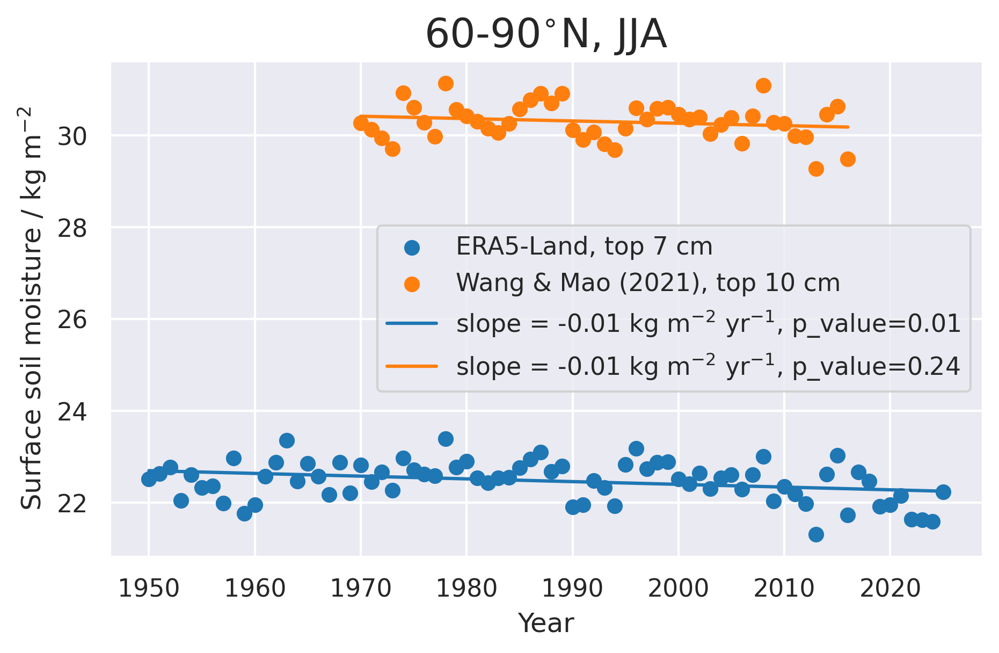

In [47]:
import seaborn as sns
from scipy import stats
sns.set_theme()

season = 'JJA'

# Seasonal averages
ds_season_ERA = SM_Arctic_ERA5.sel(valid_time=SM_Arctic_ERA5.valid_time.dt.season==season)
ds_annual_ERA = ds_season_ERA.groupby(ds_season_ERA.valid_time.dt.year).mean('valid_time')

ds_season_WM = SM_Arctic_WM.sel(time=SM_Arctic_WM.time.dt.season==season)
ds_annual_WM = ds_season_WM.groupby(ds_season_WM.time.dt.year).mean('time')

plt.figure(figsize=(7, 4), dpi=300)

plt.scatter(ds_annual_ERA.year[0], ds_annual_ERA['swvl1'].isel(year=0)*70, color='tab:blue', label='ERA5-Land, top 7 cm')
plt.scatter(ds_annual_WM.year[0], ds_annual_WM['mrsos'].isel(year=0), color='tab:orange', label='Wang & Mao (2021), top 10 cm')

for i in range(1, len(ds_annual_ERA.year)):
    plt.scatter(ds_annual_ERA.year[i], ds_annual_ERA['swvl1'].isel(year=i)*70, color='tab:blue')

slope, intercept, r_value, p_value, std_err = stats.linregress(ds_annual_ERA.year, ds_annual_ERA['swvl1'].values*70)
plt.plot(ds_annual_ERA.year, intercept+slope*ds_annual_ERA.year, color='tab:blue',
         label='slope = '+str(np.round(slope,2))+' kg m$^{-2}$ yr$^{-1}$, p_value='+str(np.round(p_value,2)))


for i in range(1, len(ds_annual_WM.year)):
    plt.scatter(ds_annual_WM.year[i], ds_annual_WM['mrsos'].isel(year=i), color='tab:orange')

slope, intercept, r_value, p_value, std_err = stats.linregress(ds_annual_WM.year, ds_annual_WM['mrsos'].values)
plt.plot(ds_annual_WM.year, intercept+slope*ds_annual_WM.year, color='tab:orange',
         label='slope = '+str(np.round(slope,2))+' kg m$^{-2}$ yr$^{-1}$, p_value='+str(np.round(p_value,2)))
#plt.grid()
plt.legend()
plt.xlabel('Year')
plt.ylabel('Surface soil moisture / kg m$^{-2}$')
plt.title(str(Arctic_lim)+'-90$^{\circ}$N, '+season, fontsize=18)
plt.show()

-0.0051168541189914535


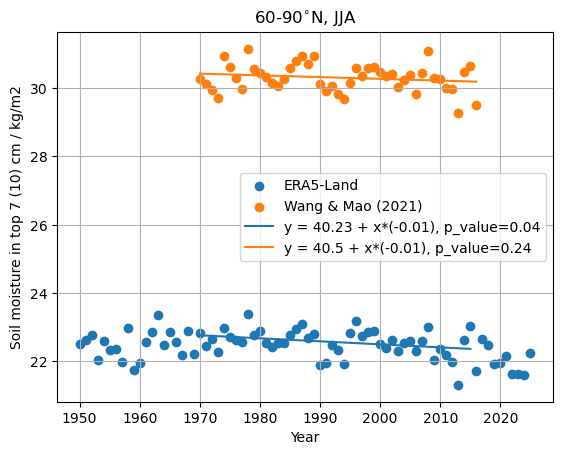

In [20]:
season = 'JJA'

# Seasonal averages
ds_season_ERA = SM_Arctic_ERA5.sel(valid_time=SM_Arctic_ERA5.valid_time.dt.season==season)
ds_annual_ERA = ds_season_ERA.groupby(ds_season_ERA.valid_time.dt.year).mean('valid_time')

ds_season_WM = SM_Arctic_WM.sel(time=SM_Arctic_WM.time.dt.season==season)
ds_annual_WM = ds_season_WM.groupby(ds_season_WM.time.dt.year).mean('time')


plt.scatter(ds_annual_ERA.year[0], ds_annual_ERA['swvl1'].isel(year=0)*70, color='tab:blue', label='ERA5-Land')
plt.scatter(ds_annual_WM.year[0], ds_annual_WM['mrsos'].isel(year=0), color='tab:orange', label='Wang & Mao (2021)')

for i in range(1, len(ds_annual_ERA.year)):
    plt.scatter(ds_annual_ERA.year[i], ds_annual_ERA['swvl1'].isel(year=i)*70, color='tab:blue')

for i in range(1, len(ds_annual_WM.year)):
    plt.scatter(ds_annual_WM.year[i], ds_annual_WM['mrsos'].isel(year=i), color='tab:orange')


from scipy import stats

slope, intercept, r_value, p_value, std_err = stats.linregress(ds_annual_ERA.year.sel(year=slice(1970,2015)), ds_annual_ERA['swvl1'].sel(year=slice(1970,2015)).values*70)
plt.plot(ds_annual_ERA.year.sel(year=slice(1970,2015)), intercept+slope*ds_annual_ERA.year.sel(year=slice(1970,2015)), color='tab:blue',
         label='y = '+str(np.round(intercept,2))+' + x*('+str(np.round(slope,2))+'), p_value='+str(np.round(p_value,2)))

slope, intercept, r_value, p_value, std_err = stats.linregress(ds_annual_WM.year, ds_annual_WM['mrsos'].values)
plt.plot(ds_annual_WM.year, intercept+slope*ds_annual_WM.year, color='tab:orange',
         label='y = '+str(np.round(intercept,2))+' + x*('+str(np.round(slope,2))+'), p_value='+str(np.round(p_value,2)))
print(slope)
plt.grid()
plt.legend()
plt.xlabel('Year')
plt.ylabel('Soil moisture in top 7 (10) cm / kg/m2')
plt.title(str(Arctic_lim)+'-90$^{\circ}$N, '+season)
plt.show()

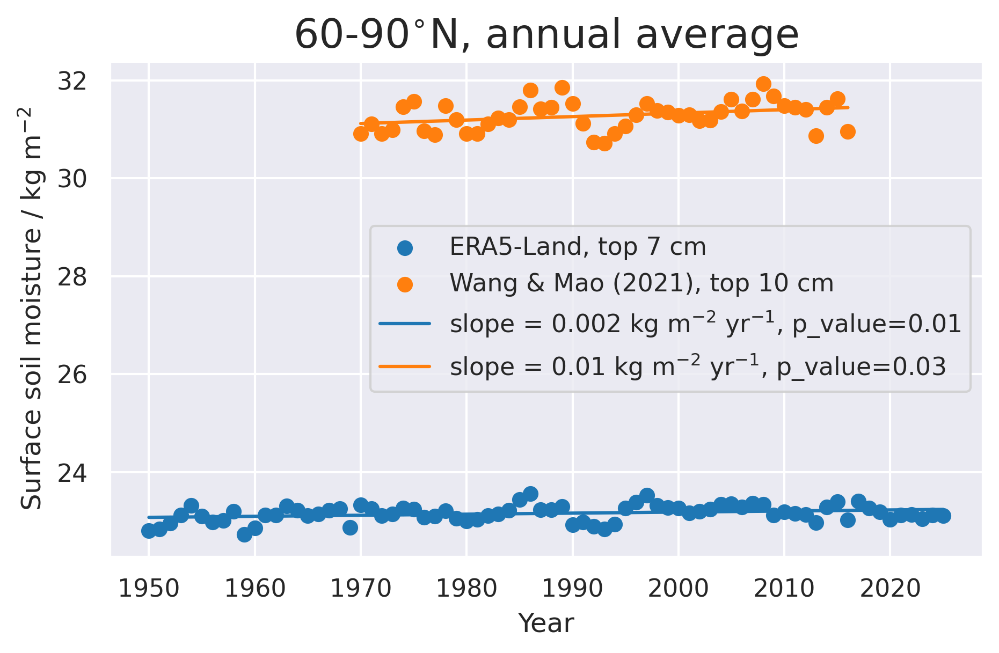

In [51]:
import seaborn as sns
from scipy import stats
sns.set_theme()

season = 'JJA'

# Seasonal averages
ds_annual_ERA = SM_Arctic_ERA5.groupby(SM_Arctic_ERA5.valid_time.dt.year).mean('valid_time')

ds_annual_WM = SM_Arctic_WM.groupby(SM_Arctic_WM.time.dt.year).mean('time')

plt.figure(figsize=(7, 4), dpi=300)

plt.scatter(ds_annual_ERA.year[0], ds_annual_ERA['swvl1'].isel(year=0)*70, color='tab:blue', label='ERA5-Land, top 7 cm')
plt.scatter(ds_annual_WM.year[0], ds_annual_WM['mrsos'].isel(year=0), color='tab:orange', label='Wang & Mao (2021), top 10 cm')

for i in range(1, len(ds_annual_ERA.year)):
    plt.scatter(ds_annual_ERA.year[i], ds_annual_ERA['swvl1'].isel(year=i)*70, color='tab:blue')

slope, intercept, r_value, p_value, std_err = stats.linregress(ds_annual_ERA.year, ds_annual_ERA['swvl1'].values*70)
plt.plot(ds_annual_ERA.year, intercept+slope*ds_annual_ERA.year, color='tab:blue',
         label='slope = '+str(np.round(slope,3))+' kg m$^{-2}$ yr$^{-1}$, p_value='+str(np.round(p_value,2)))


for i in range(1, len(ds_annual_WM.year)):
    plt.scatter(ds_annual_WM.year[i], ds_annual_WM['mrsos'].isel(year=i), color='tab:orange')

slope, intercept, r_value, p_value, std_err = stats.linregress(ds_annual_WM.year, ds_annual_WM['mrsos'].values)
plt.plot(ds_annual_WM.year, intercept+slope*ds_annual_WM.year, color='tab:orange',
         label='slope = '+str(np.round(slope,2))+' kg m$^{-2}$ yr$^{-1}$, p_value='+str(np.round(p_value,2)))
#plt.grid()
plt.legend()
plt.xlabel('Year')
plt.ylabel('Surface soil moisture / kg m$^{-2}$')
plt.title(str(Arctic_lim)+'-90$^{\circ}$N, annual average', fontsize=18)
plt.show()

Text(0.5, 0, 'Soil moisture, kg/m2')

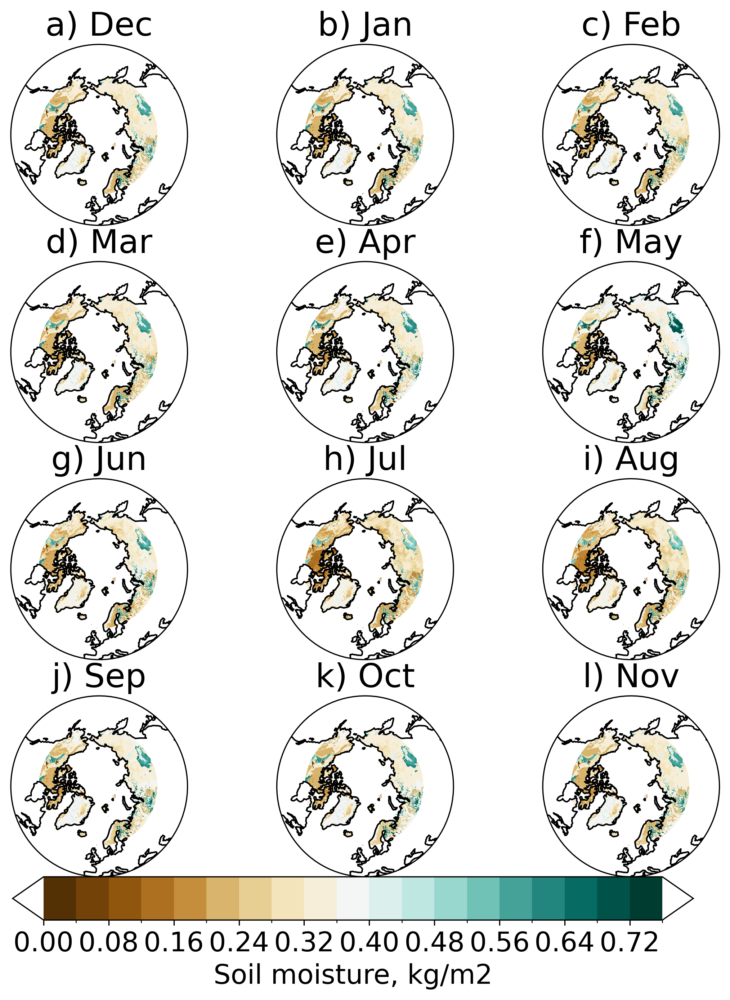

In [5]:
var = 'swvl1'
lim = 30
levels = np.linspace(-lim, lim, 21)
levels=21

SM_ERA5_monthly = SM_ERA5.groupby(SM_ERA5.valid_time.dt.month).mean('valid_time')

# Set the projection to use for plotting
fig,axs = plt.subplots(nrows=4, ncols=3, figsize=[9,10],dpi=300,  subplot_kw={'projection':ccrs.Orthographic(0, 90)})

months = [[12, 1, 2], 
        [3, 4, 5], 
        [6, 7, 8], 
        [9, 10, 11]]

month_names = [['Dec', 'Jan', 'Feb'], 
        ['Mar', 'Apr', 'May'], 
        ['Jun', 'Jul', 'Aug'], 
        ['Sep', 'Oct', 'Nov']]

labels = [['a)', 'b)', 'c)'], 
        ['d)', 'e)', 'f)'], 
        ['g)', 'h)', 'i)'], 
        ['j)', 'k)', 'l)']]

for row in range(4):
    for col in range(3):
        ax = axs[row][col]
        month = months[row][col]
        SM_m = SM_ERA5_monthly.sel(month=month)

        functions.polarCentral_set_latlim([40,90], ax)
        data = SM_m[var]
        map = data.plot.pcolormesh(ax=ax, transform=ccrs.PlateCarree(), 
                                                cmap='BrBG', levels=levels,
                                                add_colorbar=False)
        ax.set_title(labels[row][col]+' '+month_names[row][col], fontsize=22)        
        ax.coastlines()


cb_ax = fig.add_axes([0.15, 0.07, 0.7, 0.04])

cbar = plt.colorbar(map, cax=cb_ax, spacing = 'uniform', extend='both', orientation='horizontal', fraction=0.046, pad=0.06)
cbar.ax.tick_params(labelsize=18)
cbar.ax.set_xlabel('Soil moisture, kg/m2', fontsize=18)
#cbar.ax.set_xlabel('Soil moisture, %', fontsize=18)
